$\color{green}{\text{This notebook is best viewed in jupyter lab/notebook. You may also choose to use Google Colab but some parts of the images/colouring will not be rendered properly.}}$

**Preset for colab:**

In [107]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [108]:
cd /content/drive/MyDrive/ECE4076_Lab3_StudentPack/ECE4076_Lab3_StudentPack/

/content/drive/MyDrive/ECE4076_Lab3_StudentPack/ECE4076_Lab3_StudentPack


# Lab 3 (Weeks 8,9): k-Means Clustering

<div class="alert alert-block alert-warning">

<b>Enter you credentials below</b>

- <b>Student Name:</b> Sihan Ren
- <b>Student ID:</b> 31975658
- <b>Date:</b> Aprial 29, 2023
    

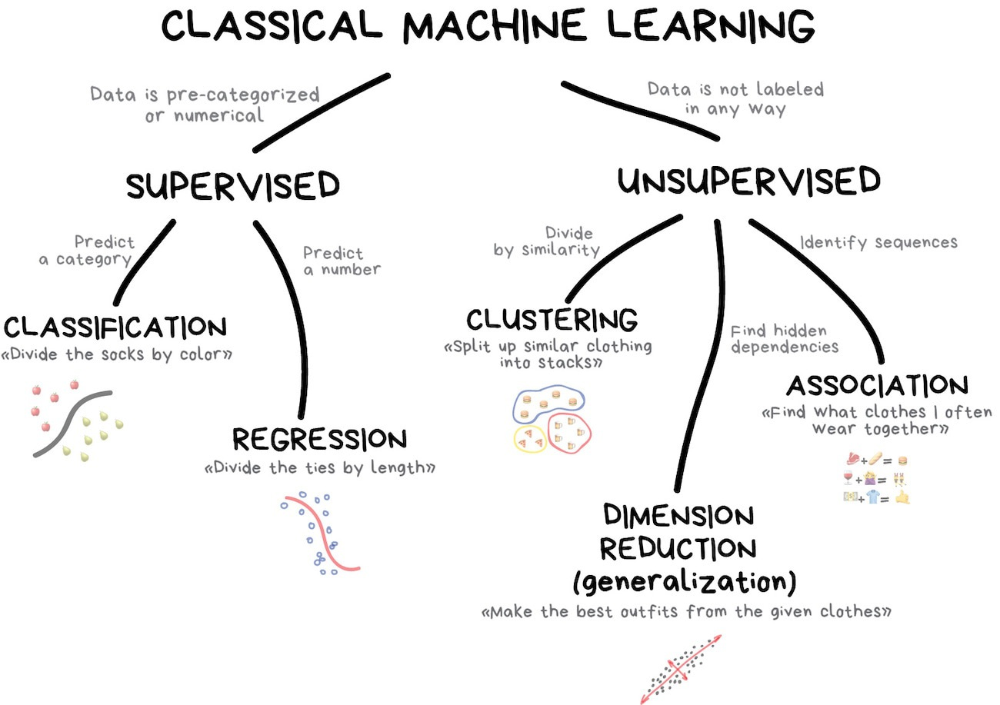

## Unsupervised Learning

As the name suggests, unsupervised learning is a type of machine learning in which the training of a model is not supervised using labels of the training dataset. Instead, models themselves attempt to find hidden patterns and insights from the given data. Unsupervised learning cannot be directly applied to a regression or classification problem because unlike supervised learning, we have the input data but no corresponding output data (no labels). The goal of unsupervised learning is to find the underlying structure of the dataset, group that data according to similarities, and represent the data in a compressed format.

## Clustering

Clustering is a type of unsupervised learning which involves grouping of data points. Given a set of data points, we can use a clustering algorithm to classify each data point into a specific group. In theory, data points that are in the same group should have similar properties and/or features, while data points in different groups should have highly dissimilar properties and/or features. Some examples of popular clustering algorithms are:
- __K-Means Clustering__
- __Mean-Shift Clustering__
- Spectral Clustering
- DBSCAN
- Gaussian Mixture Models (GMM)

In this lab, we will be implementing k-means clustering and mean-shift clustering on the same dataset. 

## K-Means Clustering

K-Means Clustering is one of the simplest unsupervised machine learning algorithms. You will first decide a number *k*, which corresponds to the number of clusters that you desire to have in your dataset. This number will also correspond to the number of centroids. A centroid is the location representing the center of a cluster. Each data point in your dataset is allocated to a specific cluster following a set of rules in an iterative manner. Also, the locations of the centroids are updated subsequently by averaging the data points assigned to the respective cluster. The **‘means’** in the k-Means Clustering refers exactly to this method of updating each cluster centroid.

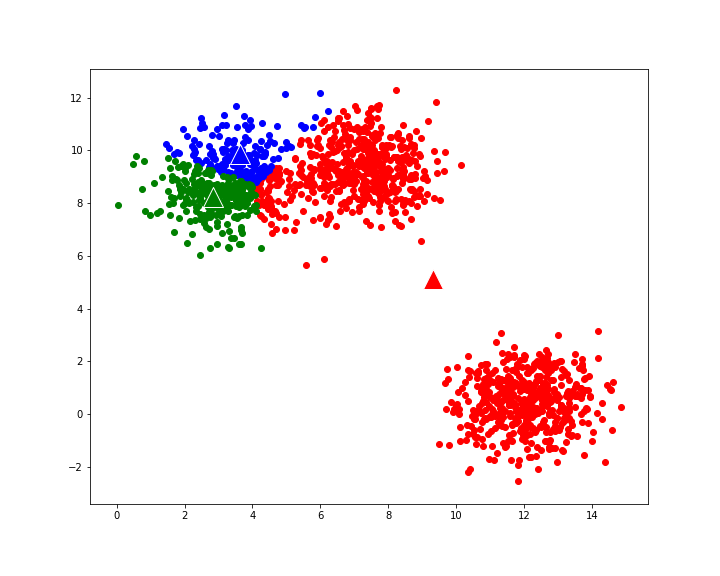

## What you should do in this lab exercise!

In this laboratory exercise, you will create a program that clusters and re-colours each pixel in a provided colour image to **k** mean colours using the k-means clustering algorithm. In all of the tasks below, you may not use any pre-written libraries for k-Means Clustering (e.g. **no** scikit-learn), instead you should use your knowledge of python and numpy to build your own code to perform k-Means Clustering. Your end result of the clustered image should look something like the one shown below.

*Note*: If you cannot see the displayed image '*objective_sharon.jpg*', have a look into the provided '*img*' folder.

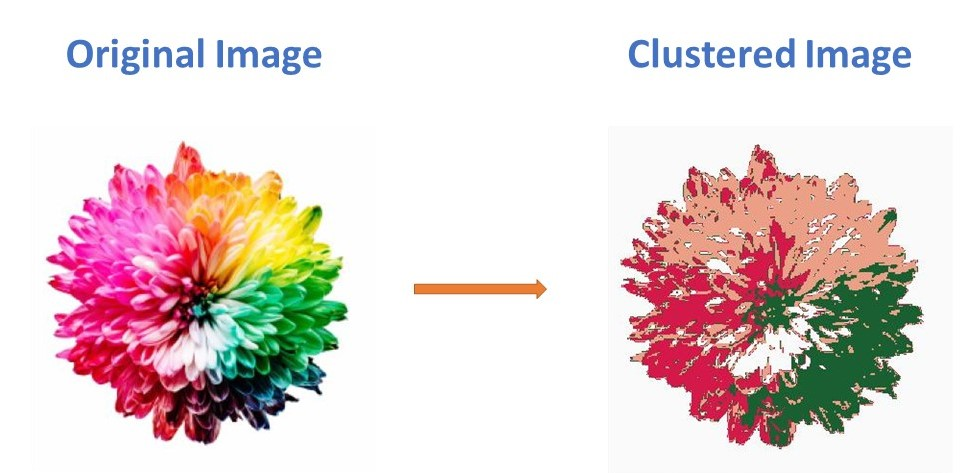

<div class="alert alert-block alert-warning">
    
You are going to work on the following six tasks throughout this lab. <span style="color:red"> </span>

- **Task 1** : Distance Function
- **Task 2** : k-Means Clustering and visualisation
- **Task 3** : k-Means++ Initialization
- **Task 4** : GMM: Analysing Data Distributions.
- **Task 5** : Mean Shift - Data Modelling via its distribution.
- **Task 6** : Comparison between k-Means, k-Means++ Initialization and Mean-Shift.
    
</div>

In [109]:
# As always, we first import several libraries that will be helpful to solve the tasks
# Important: You are only allowed to use cv2 to import images, but you may NOT use the contained k-means functionality
# For the GMM, you will run through the steps of understanding the model, then use a library to apply it to the same image from the k-means task

import matplotlib.pyplot as plt  
from mpl_toolkits import mplot3d
import numpy as np     
import cv2
import time

from IPython.display import clear_output
from matplotlib.colors import ListedColormap

<div class="alert alert-block alert-info">

## Task 1: Distance function
In this task, you wil build a helper function to compute the squared distance from a set of data points to a set of mean values (*aka* centroids). You are given a small dataset of five data points and two centroids for testing. Using your 'dist2c' function, you will compute distances from each centroid to every data point. Finally, you will visualize your results and check whether your distances are correct by assigning the data points to the closest centroid and displaying the results.
    
</div>

Now, write your own **dist2c** function, which takes a set of data points ('*data*') and a set of means ('*centroids*') and computes the squared distance from each mean to every data point.

In [110]:
def dist2c(data, centroids):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - data      : numpy array of size N x d
    #          centroids : numpy array of size c x d
    # Output - dist      : numpy array of size c x N
    # N = the number of data points, c = the number of centroids, d = dimension of data

    ### Insert your solution here ###
    N, d = data.shape
    c, _ = centroids.shape
    dist = np.zeros((c, N))
    for i in range(N):
      for j in range(c):
        dist[j, i] = np.sum((data[i, :] - centroids[j, :])**2)

    return dist

Now, let's check the function you wrote on the following provided data points.
- X contains five 3-dimensional data points

\begin{equation}
X = 
\begin{bmatrix}
0.67187976 & 0.44254368 & 0.17900127\\
0.55085456 & 0.65891464 & 0.18370379\\
0.79861987 & 0.3439561  & 0.68334744\\
0.36695437 & 0.15391793 & 0.81100023\\
0.22898267 & 0.58062367 & 0.5637733 
\end{bmatrix}
\end{equation}

- M contains two centroids
\begin{equation}
M = 
\begin{bmatrix}
0.66441854 & 0.08332493 & 0.54049661\\
0.05491067 & 0.94606233 & 0.29515262
\end{bmatrix}
\end{equation}

Use your **dist2c** function to compute the distances from each centroid to every data point. Print your results. If you wrote the function correctly, your answer should be close to:

\begin{bmatrix}
0.25977266 & 0.47150141 & 0.10634496 & 0.16664051 & 0.43745224\\
0.64767303 & 0.34083498 & 1.0663305 & 0.99096278 & 0.23600355
\end{bmatrix}

In [111]:
### Insert your solution here ###
X = np.array([[0.67187976, 0.44254368, 0.17900127],
              [0.55085456, 0.65891464, 0.18370379],
              [0.79861987, 0.3439561, 0.68334744],
              [0.36695437, 0.15391793, 0.81100023],
              [0.22898267, 0.58062367, 0.5637733]])

M = np.array([[0.66441854, 0.08332493, 0.54049661],
              [0.05491067, 0.94606233, 0.29515262]])

dist = dist2c(X, M)
print(dist)

[[0.25977266 0.47150141 0.10634496 0.16664051 0.43745224]
 [0.64767303 0.34083498 1.0663305  0.99096278 0.23600355]]


Write a code to draw a 3D scatter plot assigning each datapoint to its closest centroid using two colors.

*Hint*: Use the '*scatter3D*' function from matplotlib, and choose a different marker (or different marker size) to indicate the cluster centroids.

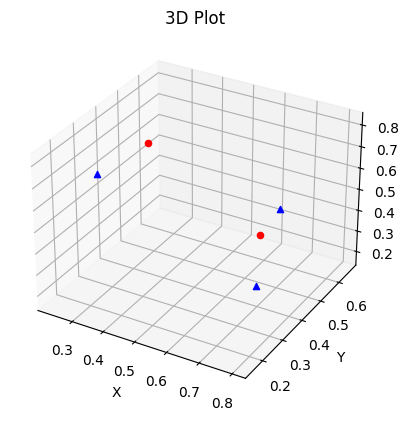

In [112]:
### Insert your solution here ###

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

for n in range(dist.shape[1]):
  c1 = dist[0, n]
  c2 = dist[1, n]

  x = X[n, 0]
  y = X[n, 1]
  z = X[n, 2]

  if c2 < c1:
    ax.scatter(x, y, z, marker = 'o', c = 'r')
  else:
    ax.scatter(x, y, z, marker = '^', c = 'b')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Plot')

plt.show()

# Create the plot and display the result

<div class="alert alert-block alert-success">
    
#### What do you observe here? Are the data points assigned to their closest centroid?

Write your answer here

</div>

<div class="alert alert-block alert-info">

## Task 2: K-means Clustering
In this task, you will implement k-Means Clustering. First, you will write a function to generate random centroids for initialization. Then you will write a function to perform k-Means Clustering (You may want to follow the steps on the lab instructions sheet). Afterwards, you will use these functions to cluster the pixels of the provided *sharon.jpg* image. Finally, you will display the results.    
    
</div>

Write a function **random_centroids**, which takes a dataset and an integer value k (= number of centroids) as inputs, and generates k number of _centroids_ which are randomly sampled from the dataset.

In [113]:
def random_centroids(data, k):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - data     : numpy array (N x d)
    #        - k        : number of the centroids
    # Output - centroids: numpy array (k x d)
    # N = number of data points, d = dimension of data, k = number of centroids
    
    ### Insert your solution here ###
    row, col, d = data.shape
    centroids = np.random.rand(k, d)
    
    return centroids

Write a function **mykMeans**, which takes a dataset, an set of k centroids and an integer value T (= number of iterations) as inputs. The function should perform k-Means Clustering on the input dataset by using the input centroids as intilization. After running for T iterations, the function should finally output a cluster index for each data point, the final set of k centroids, and the loss vector containing the k-Means loss at each iteration. (You may want to use your function **dist2c** to compute distances between centroids and data points at each iteration.)

In [114]:
def mykMeans(data, centroids, T):
    # The inputs and the outputs of your function should be as follows:
    # Inputs  - data        : numpy array (N x d)
    #         - centroids   : numpy array (k x d)
    #         - T           : number of the interations 
    # Outputs - cluster_idx : numpy array (N,)
    #         - centroids   : numpy array (k x d)
    #         - losses      : list (T)
    # N = number of data points, d = dimension of data, k = number of centroids, T = number of iterations
    
    N, d = data.shape
    k, _ = centroids.shape

    dist = np.zeros(k)
    cluster_idx = np.zeros(N)
    kMeans_loss = np.zeros(T)

    ## loop T times
    for t in range(T): 
        ## calculate the distance and save the cluster index of each pixel
        for i in range(N):
            for n in range(k):
                dist[n] = np.sum((data[i] - centroids[n])**2)
            cluster_idx[i] = np.argmin(dist)
    
        ## calculate sum squared difference of the image at each iteration
        loss = 0
        for i in range(k):
            cluster_data = data[cluster_idx == i]
            loss += np.sum((cluster_data - centroids[i])**2)
        kMeans_loss[t] = loss
        
        ## update the centroids
        for i in range(k):
            cluster_mask = (cluster_idx == i)  
            cluster_data = data[cluster_mask]  
            centroids[i] = np.mean(cluster_data, axis=0)  
        
    return cluster_idx, centroids, kMeans_loss


Load the *sharon.jpg* image and display it.

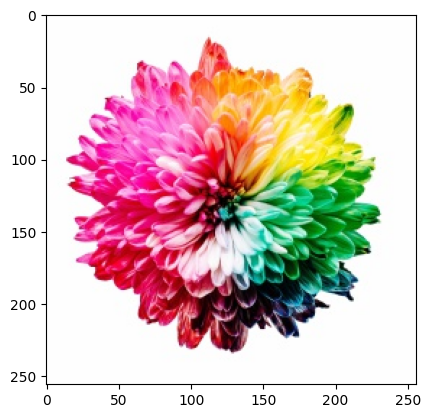

In [115]:
### Insert your solution here ###
img_sharon = cv2.imread('./sharon.jpg')
## convert img_sharon from BGR to RGB 
img_sharon = img_sharon[:, :, [2, 1, 0]]

plt.imshow(img_sharon)
plt.show()

Now, use your **random_centroids** function to generate four random centroids. Then, use your **mykMeans** function to cluster the pixels of the *sharon.jpg* image by running it for 20 iterations (T=20). (*Hint*: You may want to reshape your image before applying the **mykMeans** function.) </br> Display the final clustered image. Each pixel should be displayed by the colour of the assigned centroid (i.e. you should only see a total of *k* colours in your clustered image).

In [116]:
# Define a fixed random seed for repeatability
np.random.seed(17)

### Insert your solution here ###
# Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image

centroids = random_centroids(img_sharon, 6)
cluster_idx, centroids, kMeans_loss = mykMeans(img_sharon.reshape(-1, 3), centroids, 20)

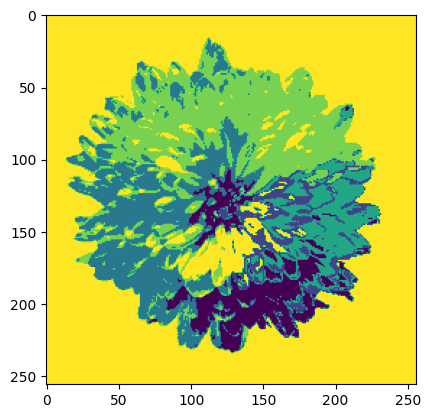

In [117]:
plt.imshow(cluster_idx.reshape(256, 256))
plt.show()

<div class="alert alert-block alert-success">
    
#### Have some fun with your k-Means Clustering impementation! Run the program several times with different random seeds to see if you always converge to the same solution. Try changing k from 4 to other numbers (from 2 to 10) and see how this affects the output and the repeatability of the program. Report and discuss your observations.


Write your answer here

</div>

In [118]:
##
## Answer:
## When I run the k-Means clustering with the same random seeds, i get the same solution each time because the same initial conditions are used. However, when I running it with different seeds, it leads to slightly different results due to the different initial conditions.
## Increasing the k number results in more distinct clusters in the output, but also makes it harder to find the optimal solution because there are more centroids to optimize. Decreasing k will result in fewer distinct clusters, but will make it easier to find the optimal solution.
## The number of iterations affects the degree of convergence to the optimal solution during execution. The higher the number of iterations, the higher the chance of finding the optimal solution, but it also increases the computation time. When k is 6, the final iteration loss is relative small.

Now, visualize how the centroids are updated during k-Means Clustering. For that, you should write a code to plot the data points along with the centroids and display both the plot and the clustered image side-by-side. Then, use that function inside your k-Means Clustering implementation to observe how the centroids move with each iteration. 

Write your own function **visualize** which takes the dataset, cluster indices, centroids and sample indices, and generates a figure of two subplots:
1. A 3D scatter plot of the datapoints and centroids.
2. A display of the clustered image

For the 3D scatter plot, the colour of each data point should reflect the colour of the closest centroid (i.e. the centroid which it is assigned to). As it is computationally expensive to plot all the data points at each iteration, you may only draw 250 randomly selected data points (to speed things up).

In [119]:
def visualize(data, cluster_idx, centroids, sample_idx):
    fig = plt.figure(figsize=(12, 6))
    
    # Create 3D scatter plot
    ax1 = fig.add_subplot(121, projection='3d')
    colors = ['r', 'g', 'b', 'y', 'c', 'm', 'k']
    
    # Plot centroids
    for i in range(len(centroids)):
        ax1.scatter(centroids[i][0], centroids[i][1], centroids[i][2], s=300, c=colors[i%len(colors)], marker='o')
        
    # Plot randomly selected data points with corresponding colors
    sample_data = data[sample_idx]
    sample_cluster_idx = cluster_idx[sample_idx]
    for i in range(len(centroids)):
        idx = sample_cluster_idx == i
        ax1.scatter(sample_data[idx, 0], sample_data[idx, 1], sample_data[idx, 2], s=50, c=colors[i%len(colors)], alpha=0.5)
        
    ax1.set_xlabel('X Label')
    ax1.set_ylabel('Y Label')
    ax1.set_zlabel('Z Label')
    ax1.set_title('K-Means Clustering')
    
    # Create clustered image subplot
    ax2 = fig.add_subplot(122)
    ax2.imshow(cluster_idx.reshape(256, 256), cmap='viridis', aspect='auto')
    ax2.axis('off')
    ax2.set_title('Clustered Image')

    plt.show()
    
    return fig



Now modify your **mykMeans** function and create a new **myKMeans_visualize** function by adding the **visualize** function that you wrote above in order to visualize the results at every iteration. 

Make sure you add a time pause of 1-2 seconds after each iteration so there is enough time for you to observe the convergence of the centroids clearly! *Hint*: the '*time*' library we imported at the beginning provides a '*sleep*' function!

In [120]:
def myKMeans_visualize(data, centroids, T):
    # The inputs and the outputs of your function should be as follows:
    # Inputs  - data        : numpy array (N x d)
    #         - centroids   : numpy array (k x d)
    #         - T           : number of the interations 
    # Outputs - cluster_idx : numpy array (N,)
    #         - centroids   : numpy array (k x d)
    #         - losses      : list (T)
    # N = number of data points, d = dimension of data, k = number of centroids, T = number of iterations
    
    N, d = data.shape
    k, _ = centroids.shape

    dist = np.zeros(k)
    cluster_idx = np.zeros(N)
    kMeans_loss = np.zeros(T)

    ## loop T times
    for t in range(T): 
        ## calculate the distance and save the cluster index of each pixel
        for i in range(N):
            for n in range(k):
                dist[n] = np.sum((data[i] - centroids[n])**2)
            cluster_idx[i] = np.argmin(dist)
    
        ## calculate sum squared difference of the image at each iteration
        loss = 0
        for i in range(k):
            cluster_data = data[cluster_idx == i]
            loss += np.sum((cluster_data - centroids[i])**2)
        kMeans_loss[t] = loss
        
        ## update the centroids
        for i in range(k):
            cluster_mask = (cluster_idx == i)  
            cluster_data = data[cluster_mask]  
            centroids[i] = np.mean(cluster_data, axis=0)  

        visualize(data, cluster_idx, centroids, np.random.randint(62500, size = 250))
        time.sleep(2)
        
    return cluster_idx, centroids, kMeans_loss

Test your new **myKMeans_visualize** function on the *sharon.jpg* image.

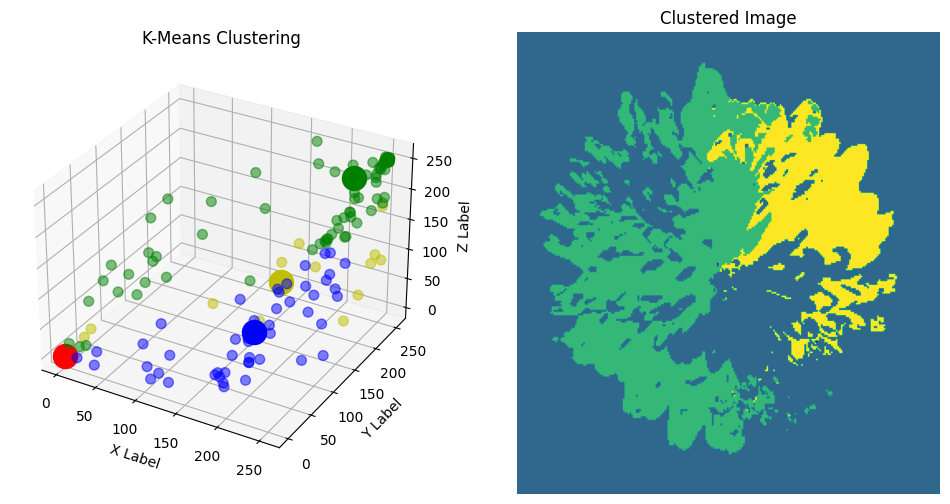

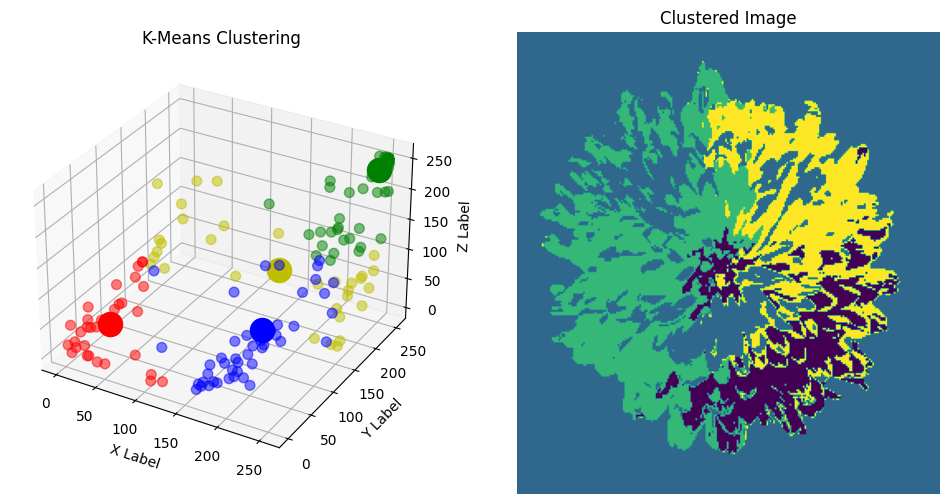

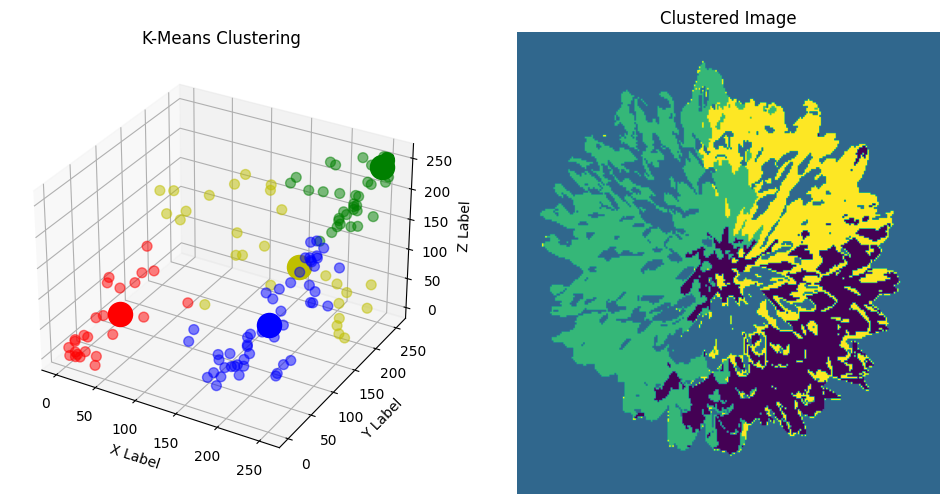

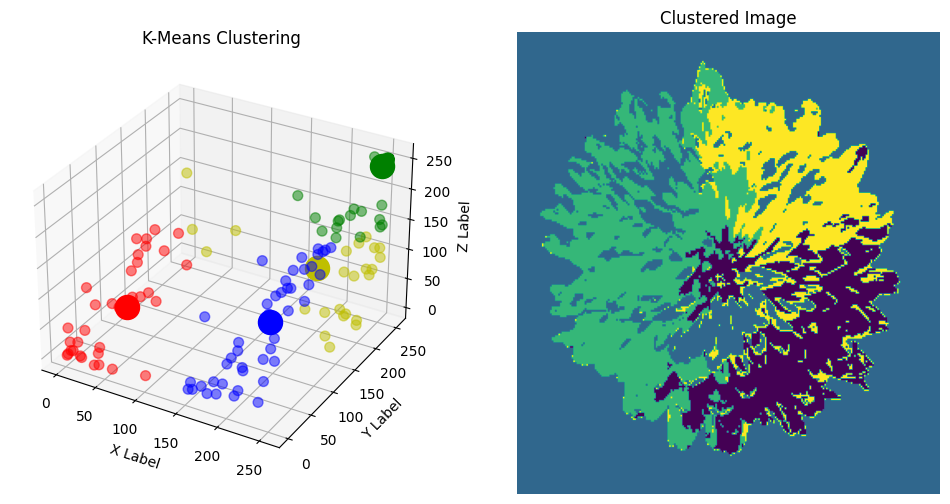

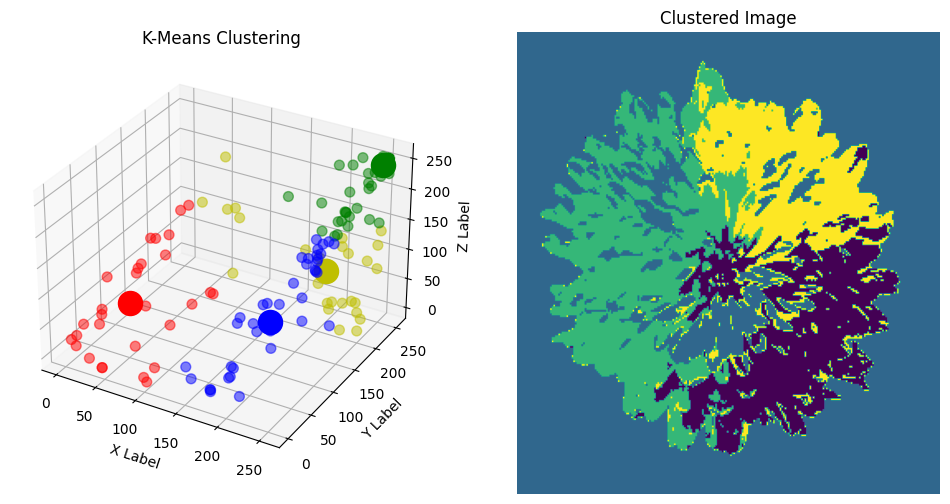

...

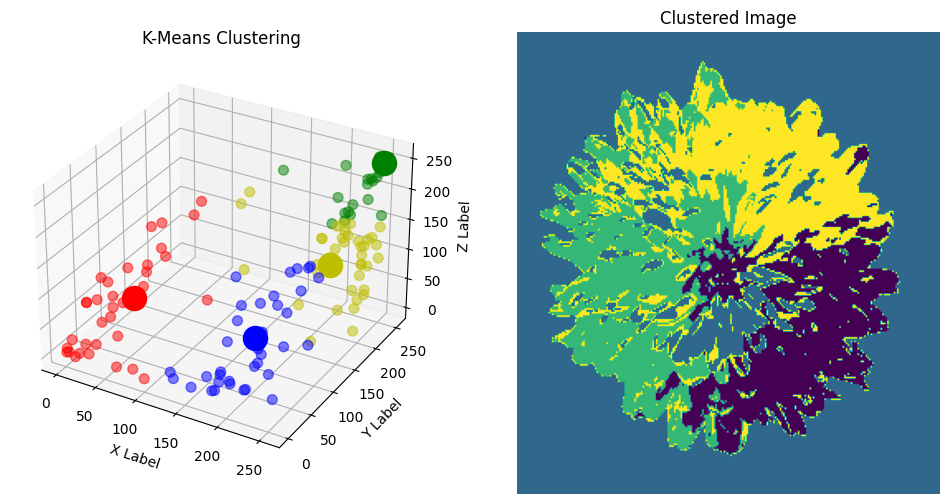

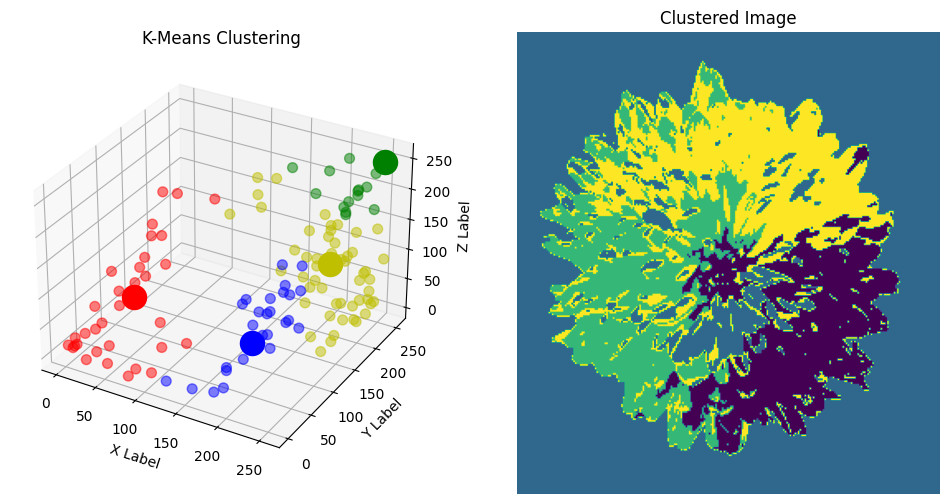

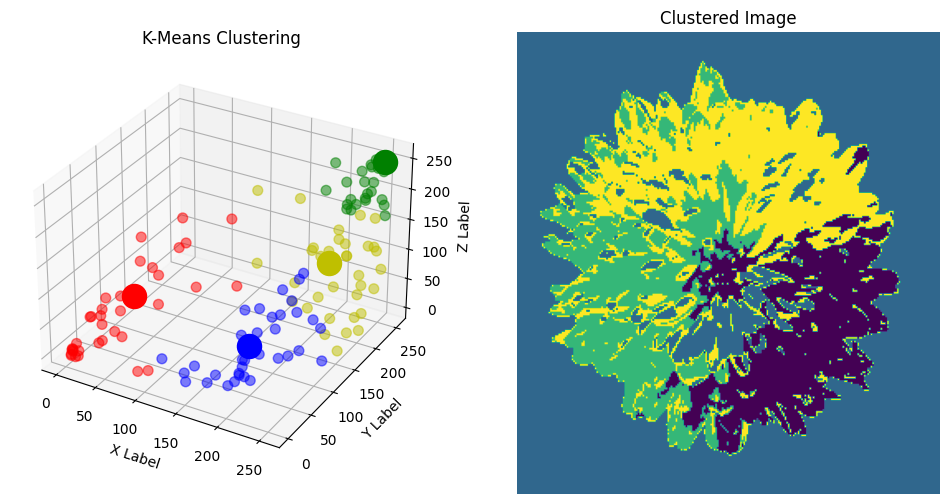

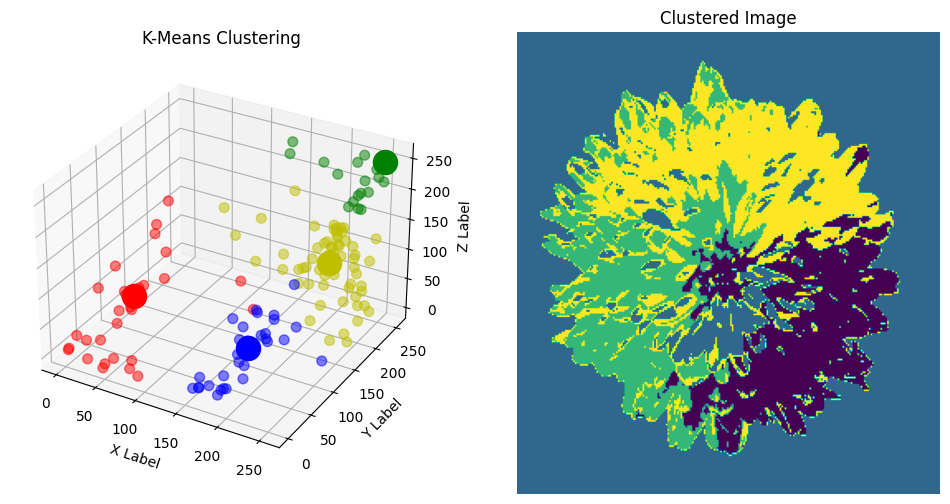

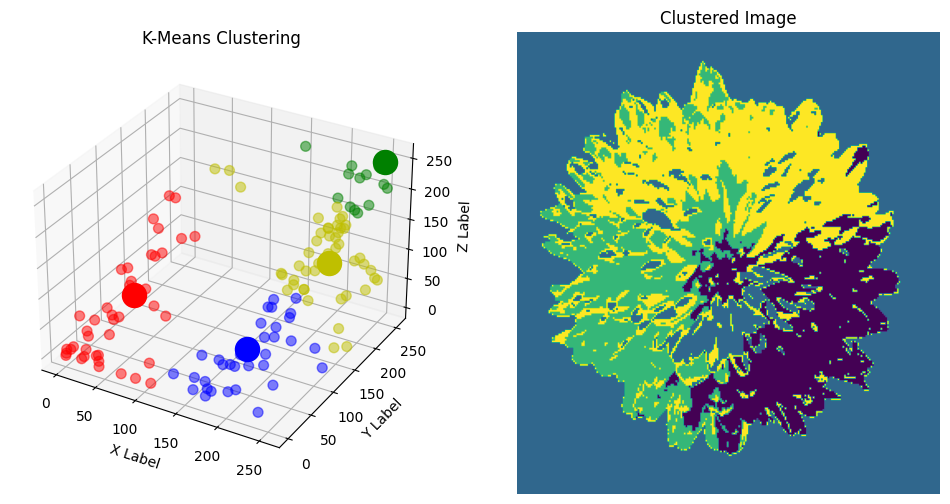

In [121]:
# Specify a random seed (will determine the random initialisation)
np.random.seed(17)

# Initialise your centroids and run your k-Means visualization function
centroids_kmeans = random_centroids(img_sharon, 4)
cluster_idx, centroids, kMeans_loss = myKMeans_visualize(img_sharon.reshape(-1, 3), centroids_kmeans, 20)

<div class="alert alert-block alert-success">
    
#### Observe how the centroids move with each iteration. Did you see any pattern in the movement of each centroid? Report and discuss your observations!


Write your answer here

</div>

In [122]:
## 
## Answer:
## 1. Centroids first start at initial random positions,
## 2. Move towards denser areas of the data points becasuse of the values of centroids are mean of cluster points.
## 3. Slow down and converge to stable positions as the cluster centers.
## 4. In some cases, centroids may oscillate around optimal positions before converging.

<div class="alert alert-block alert-info">

## Tasks 3: k-Means++ Initialization
    
In this task, you will implement the k-Means++ initialization of the k-Means Clustering algorithm. First, you will write a function to generate centroids for the initialization using the k-Means++ initialization procedure (You may want to follow the steps on the lab instructions sheet, and read up on the method using the provided reference). 

Then you will use the generated initial centroids together with your previous k-Means Clustering implementation to cluster the pixels of the *sharon.jpg* image. Finally, you will display the results.   
    
</div>

Write a function **kmeanspp_centroids**, which takes a dataset and an integer value k (= number of centroids) as inputs, and generates k centroids following the k-Means++ initilization procedure. You might want to re-use your **dist2c** function here.

In [123]:
def kmeanspp_centroids(data,k):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - data     : numpy array (N x d)
    #        - k        : an integer value
    # Output - centroids: numpy array (k x d)
    # N = number of data points, d = dimension of data, k = number of centroids
    
    ### Insert your solution here ###
    N, d = data.shape
    centroids = np.zeros((k, d))
    idx = np.random.randint(N)
    centroids[0] = data[idx]
    dist = np.zeros(N)

    for i in range(k):
        ## dist_matrix composed of number of data points x number of centroids
        dist_matrix = dist2c(data, centroids)
        min_dist = np.min(dist_matrix, axis=0)
        dist = min_dist

        probabilities = dist / np.sum(dist)
        idx = np.random.choice(N, p=probabilities)
        centroids[i] = data[idx]

    return centroids


Now, use your **kmeanspp_centroids** function to generate four random centroids. Then, use your **mykMeans** function to cluster the pixels of the *sharon.jpg* image. (You may want to reshape your image before applying the **mykMeans** function.) Display the final clustered image.

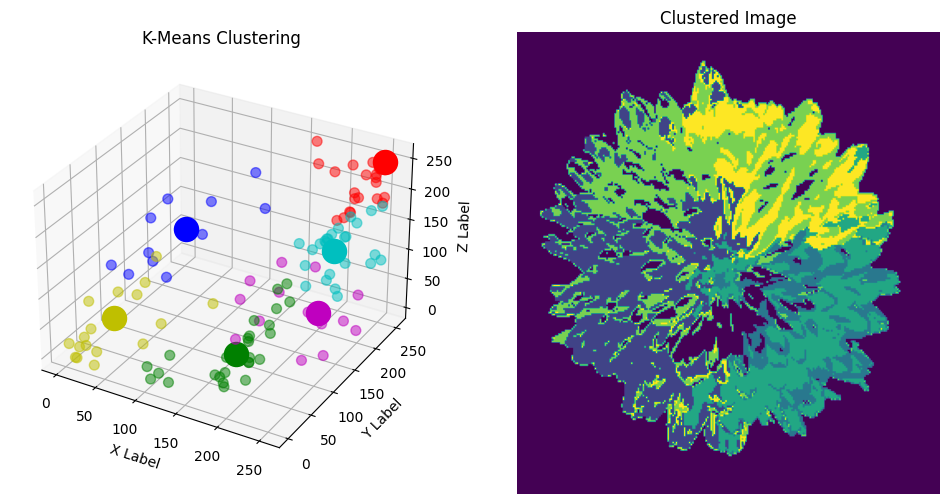

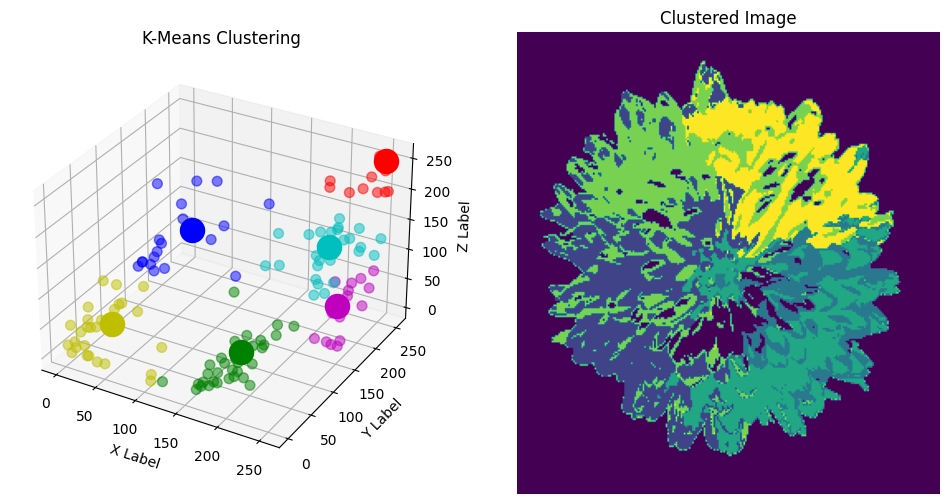

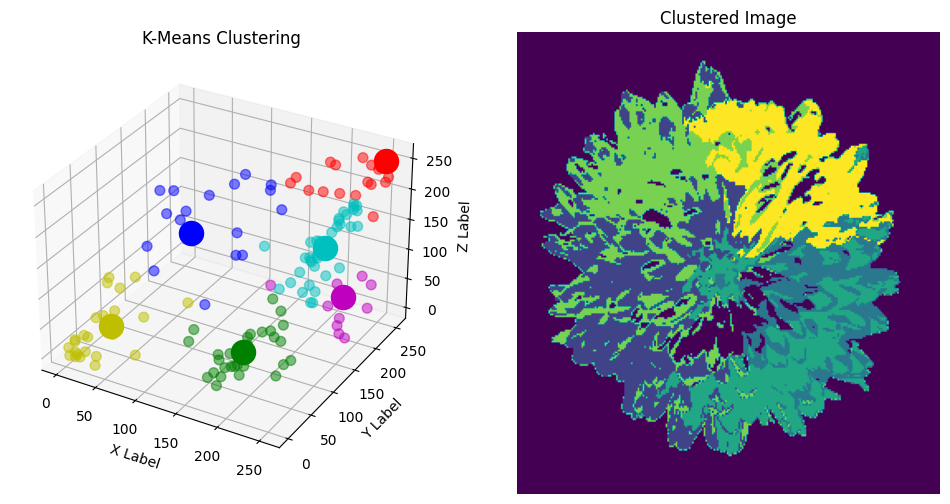

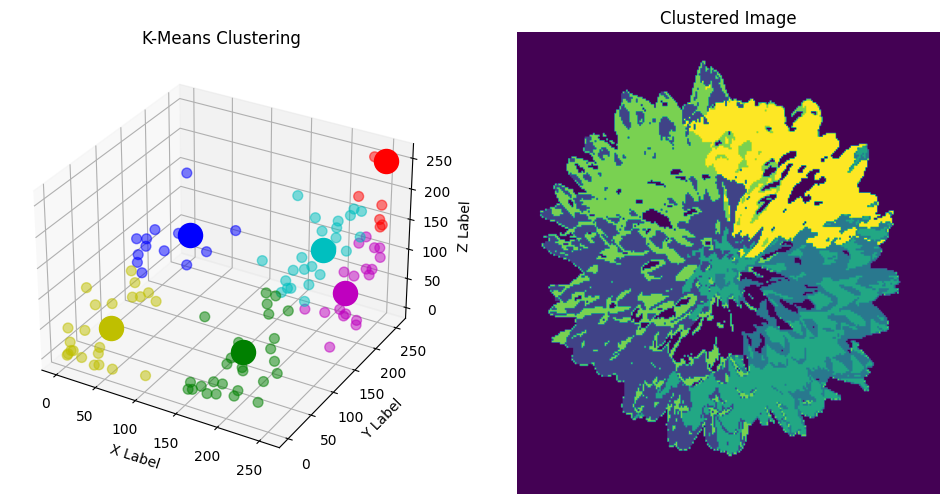

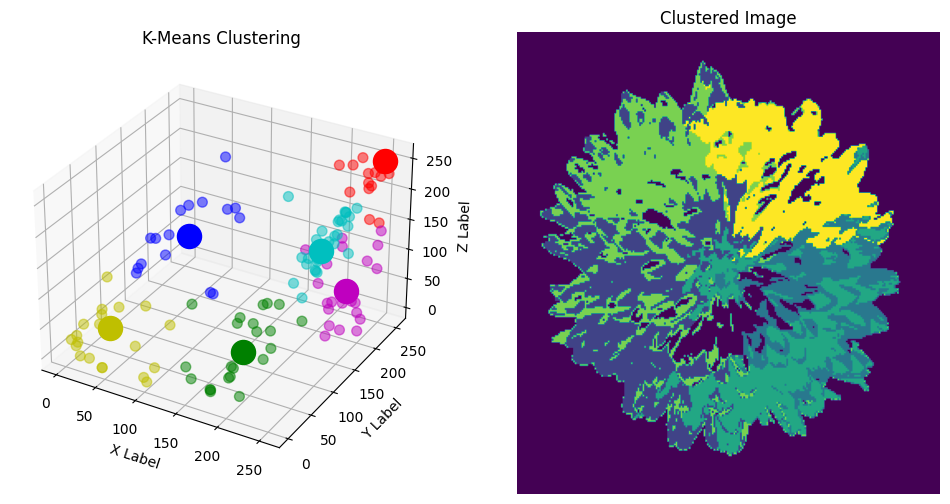

...

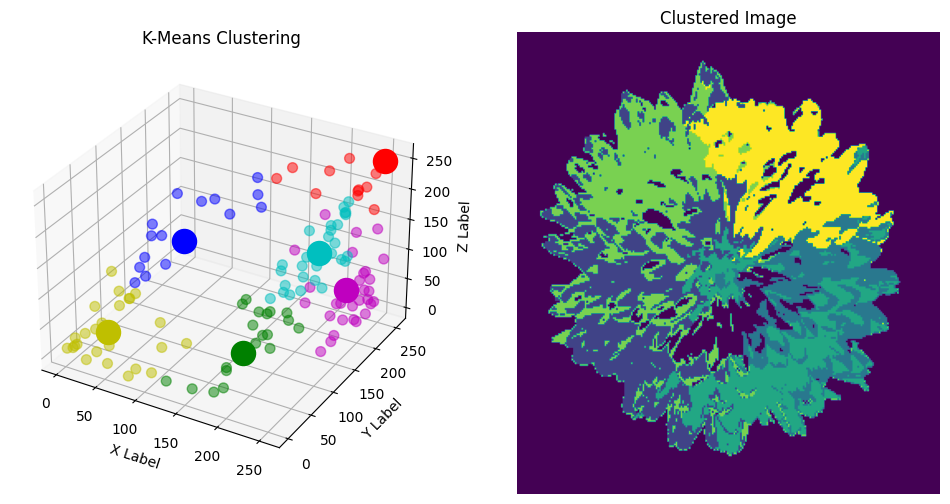

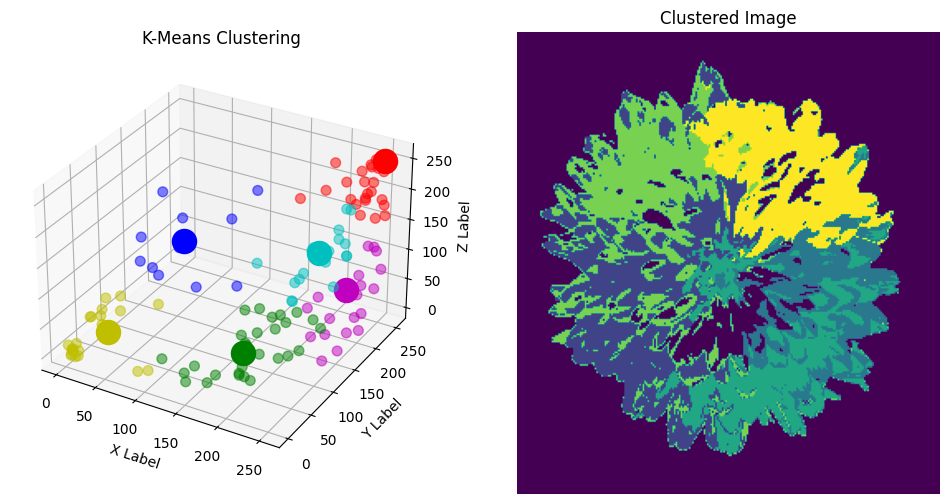

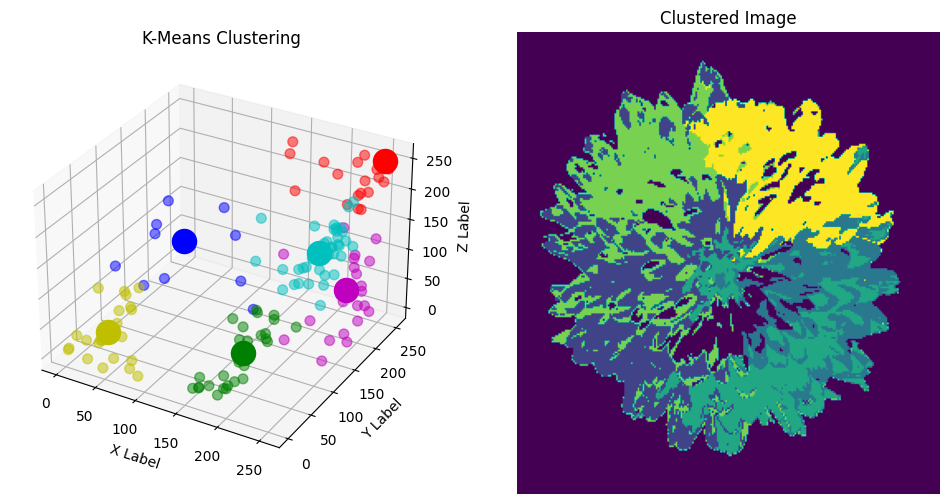

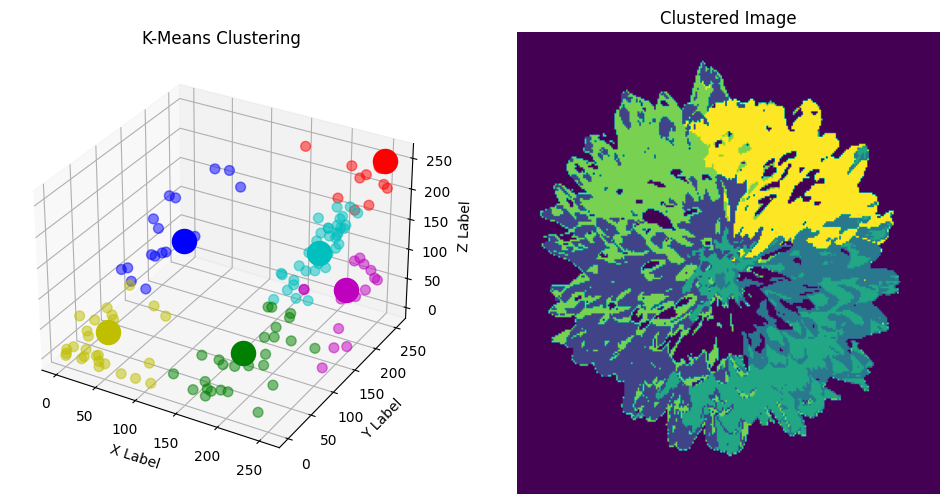

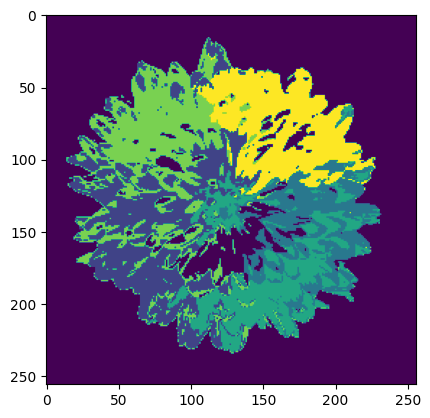

In [124]:
# We first specify our random seed here
np.random.seed(17)

### Insert your solution here ###

# Initialise the centroids with the kmeans++ method, and run the clustering
# Generate the initial centroids using K-means++ initialization
centroids_kmeanspp = kmeanspp_centroids(img_sharon.reshape(-1, 3), 6)

# Perform K-means clustering with the generated centroids
cluster_idx_1, centroids_1, kMeans_loss_1 = myKMeans_visualize(img_sharon.reshape(-1, 3), centroids_kmeanspp, 20)

# Display your results (image)
plt.imshow(cluster_idx_1.reshape(256, 256))
plt.show()

<div class="alert alert-block alert-success">
    
#### Were you able to obtain the same results (the same clustered sharon image) as you did with the random initialization, or do they differ significantly? Were you able to obtain the results faster than with the random initialization? Report your findings, and explain why you think this happens!

Write your answer here

</div>

In [125]:
##
## Answer:  
## I get differenct results. K means++ is faster because it spreads centroids more evenly.
## The result is also better compared with k means.

Now, plot the loss of the two k-Means Clustering methods over the number of iterations. You may want plot the loss curves of the two methods in the same plot for convenience of comparison, and make sure to add an appropriate legend.

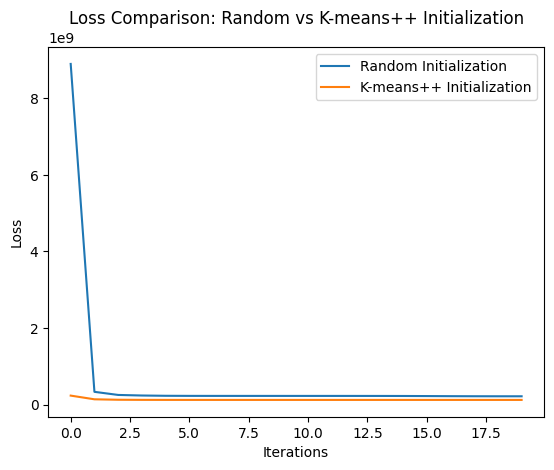

In [126]:
### Insert your solution here ###

# Display your losses for the random initialization vs. the kmeans++ initialization
plt.plot(kMeans_loss, label='Random Initialization')
plt.plot(kMeans_loss_1, label='K-means++ Initialization')

plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Loss Comparison: Random vs K-means++ Initialization')
plt.legend()
plt.show()

<div class="alert alert-block alert-success">
    
    
    
#### From your results, discuss the main differences between random initialization and k-Means++ initialization. What do you notice regarding the position of the initial centroids? Which one do you think is better, and why? What do you observe regarding the loss and convergence of both methods? Discuss the pros and cons of the two methods.

Write your answer here

</div>

In [127]:
## Answer:
## Initial centroids position:
## 
## Random initialization: Centroids are randomly choosen.
## k-means++ initialization: Centroids spreads more evenly.
##
## Loss and convergence:
## 
## Random initialization: The loss is higher at first and decrease more slowly.
## k-means++ initialization: The loss typically starts lower and decreases more rapidly due to better initial centroid positions.
##
## Pros and cons:
##
## Random initialization is simpler but can lead to suboptimal clustering results, slower convergence, and sensitivity to the initial placement of centroids.
## k-means++ initialization is more complex but can provide better initial centroid positions, leading to improved clustering results and faster convergence.

<div class="alert alert-block alert-info">
    
## Tasks 4: GMM: Analysing Data Distributions.
    
In this task, we will learn about how data can be modelled via its distribution. We first start with a toy example, which helps us understand the concepts.
    
    
</div>

### Think about your data like a pro!
You can think of any data sample as a random vector sampled from a distribution that is usually super complicated to model analytically. Nevertheless, there are various methods to estimate the distribution of data. 

Let us first look at an intuitive way of thinking about this. Consider a set of images of size $100 \times 100$ representing face images. You can think of any $100 \times 100$ data sample as a $10,000$D random vector sampled from a distribution that we do not know. If you have an image, where you put a mouth on the forehead, this impossible image has a very low-likelihood to be generated from the distribution that YOU DO NOT KNOW. However, a regular image from say your favorite artist has a reasonable likelihood to be generated from that distribution. 

We can think about data as a random process that provides us with new tools and algorithms to analyze it. 

### The game begins

OK, let us start with a toy example. We assume that our data can be modeled using a GMM with the following parameters:

\begin{align}
    &\mu_1 = -1, \quad \mu_2 = 0, \quad \mu_3 = 0.5, \quad \mu_4 = 2 \;.\\
    &\sigma_1 = 1.0, \quad \sigma_2 = 2.0, \quad \sigma_3 = 3.0, \quad \sigma_4 = 1.0\;.\\
    &\omega_1 = 0.6, \quad \omega_2 = 0.1, \quad \omega_3 = 0.1, \quad \omega_4 =  0.2\;.\\
\end{align}

We pretend that we do not know this is the case and will try below to estimate this distribution. But let's first take a closer look at the GMM itself.

In [128]:
### Insert your solution here (use numpy arrays to define the provided parameters) ###
means = np.array([-1, 0, 0.5, 2])
std_devs = np.array([1.0, 2.0, 3.0, 1.0])
weights = np.array([0.6, 0.1, 0.1, 0.2])

### Plot the pdf of a GMM

Recall that a Gaussian distribution is defined as

\begin{align}
    \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}, \boldsymbol{\Sigma}) = \frac{1}{\sqrt{2\pi\sigma^2}} \exp{\Big(-\frac{(x-\mu)^2}{2\sigma^2}\Big)}\;.
\end{align}

The pdf of a GMM with $k$ components is 



\begin{align}
    f({x}) &= \sum_{i=1}^k 
    \omega_i \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}_i, \boldsymbol{\Sigma}_i) \;.
\end{align}

Here, ${x} \in \mathbb{R}$ (in our case) is the sample we evaluate the pdf at, $\omega_i$ is the weight (i.e., mixing coefficient) of the $i$-th Gaussian component, $\boldsymbol{\mu}_i$ is the mean vector of the $i$-th Gaussian component, and $\boldsymbol{\Sigma}_i$ is the covariance matrix of the $i$-th Gaussian component. The symbol $\mathcal{N}(\cdot|\boldsymbol{\mu}_i,\boldsymbol{\Sigma}_i)$ denotes the probability density function of a multivariate Gaussian distribution with mean vector $\boldsymbol{\mu}_i$ and covariance matrix $\boldsymbol{\Sigma}_i$. 

Now, below write a code to plot the pdf of the GMM described above between [-10,10]. If your code is correct, you should see the distribution.

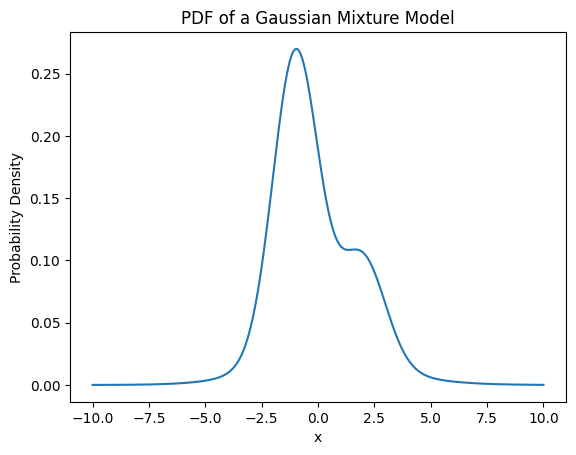

In [129]:
def normal_pdf(x , mean , sd):
    # The inputs and the outputs of your function should be as follows:
    # Inputs - x : numpy array of linearly spaced points (N x 1)
    #        - mean : an integer value
    #        - sd: an integer value
    # Output - prob_density : a numpy array of probability densities
    
    ### Insert your solution here ###
    prob_density = (1 / (np.sqrt(2 * np.pi * sd**2))) * np.exp(-(x - mean)**2 / (2 * sd**2))
    return prob_density

# we know the GMM, so plot the PDF of it
# Do this by creating some points in between -10 and 10 via linspace
# Then calculate the likelihood (probabilities) of each point.
# Hint: Look at the formulas above for information how to 'compose' the overall pdf using the components of the mixture.

### Insert your solution here ###

# Create points between -10 and 10 using linspace
x = np.linspace(-10, 10, 1000)

# Compute the likelihood (probabilities) of each point
gmm_pdf = np.zeros_like(x)
for i in range(weights.shape[0]):
    gmm_pdf += weights[i] * normal_pdf(x, means[i], std_devs[i])

# Plot the PDF of the GMM
plt.plot(x, gmm_pdf)
plt.xlabel("x")
plt.ylabel("Probability Density")
plt.title("PDF of a Gaussian Mixture Model")
plt.show()

### Next stop: Sampling from a GMM!

If we have a GMM, to draw samples from it, we can do the following:

1) First, sample from the components according to their weights using the random.choice function from the numpy package.
2) Then, sample from a normal distribution based on the chosen component and according to the parameters of the normal distribution.

Study the code below and convince yourself that what it does is to generate 1,000 samples from the GMM. 

In [130]:
num_samples = 1000

chosen_comp = np.random.choice(a=means.shape[0], size=num_samples, p=weights)

X = np.random.normal(loc=means[chosen_comp], scale=std_devs[chosen_comp], size=num_samples).reshape(-1,1)

### Hold on, what is a pdf?

<div class="alert alert-block alert-success">
    
#### Note that in the majority of cases we just have raw data and we do not know the pdf, so check the following figure and explain what it shows.

Write your answer here

</div>

In [131]:
##
## Answer:
## It shows the likehood of all points in a dataset,
## the higher the y, the larger the number of points with corresponded x appears in the dataset.

_Note_: If you cannot see the displayed image 'Task4_GMM_01_what_is_a_pdf.png', have a look into the provided 'img' folder.

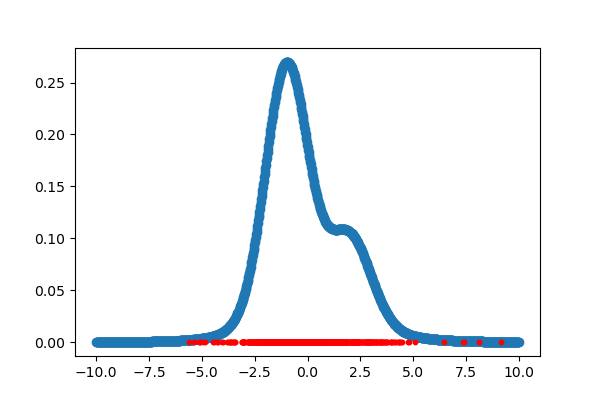

### Can we estimate the pdf from data? 

Yes, you can use a GMM to estimate the pdf or you can use a technique called the "Kernel Density Estimation" or KDE to estimate an arbitrary pdf. Check out the following code snippet and explain what you understand from the code below. Also, check the [KDE](https://en.wikipedia.org/wiki/Kernel_density_estimation) on wiki and learn about the algorithm (you can skip how the bandwidth can be set automatically if you want to)

<div class="alert alert-block alert-success">
    
#### Check out the following code snippet and use your newly acquired knowledge about KDE to explain what you understand from the code below. Also take a look at the plot and explain what you see.

Write your answer here

</div>

In [132]:
from sklearn.neighbors import KernelDensity

# There is no free-lunch. If you want to use a KDE, you need to identify appropriate hyper-parameters of 
# the algorithm, here a kernel and its parameters. We will use the Epanechnikov kernel with a bandwidth of 0.4. 
# Feel free to try other values.

kde = KernelDensity(kernel='epanechnikov', bandwidth=0.4).fit(X)

X0 = np.linspace(10, -10, 1000).reshape(-1,1)

Z0_kde = np.exp(kde.score_samples(X0))

_Note_: If you cannot see the displayed image 'Task4_GMM_02_kde.png', have a look into the provided 'img' folder. The kde-results are displayed in purple colour.

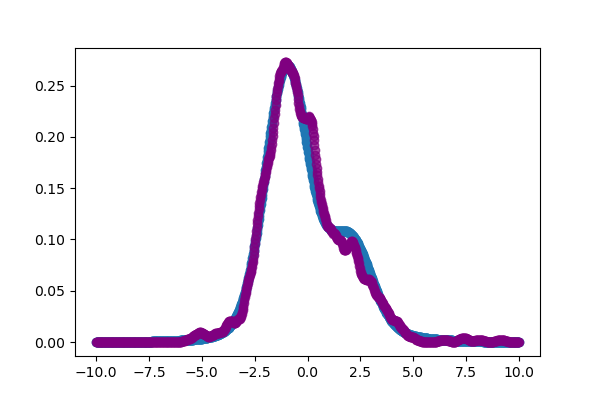

<div class="alert alert-block alert-info">
    
## Tasks 5: Mean Shift - Data Modelling via its distribution.
    
In this task, you will apply the concepts learned above for using the [mean shift algorithm](https://ieeexplore.ieee.org/document/1000236) 
 for image segmentation.
    
    
</div>

### Drumroll, here comes the Mean Shift 🐸

The [Mean Shift (MS)](https://en.wikipedia.org/wiki/Mean_shift) algorithm is a simple algorithm to find the mode of a distribution (what is the mode of a distribution? -> Make sure to look it up if you do not already know). The algorithm is iterative and employs a kernel function to find the modes from samples of a distribution. Let $k(x,z)$ be a kernel function, measuring the similarity between $x$ and $z$ (ie., the higher $k(x,z)$, the more similar are $x$ and $z$). Then using $k(x,z)$, we iterate over

\begin{align}
    m \gets \frac{ \sum_{x_i} k(x_i,m) x_i}{\sum_{x_i} k(x_i,m)} \;.
\end{align}
 
Then $m$ will be a mode of the distribution where $x_i$ are sampled from. Below, you will develop a simplified version of this algorithm using the so called _flat kernel_

\begin{align}
k_{\text{flat}}(x,z) = 
    \begin{cases}
    1 &\text{if} \;\; \|x-z\|^2 \leq h^2\\
    0 &\text{otherwise} 
    \end{cases}
\;.
\end{align}

A few comments:
1. $h$ is a hyperparameter of this kernel (we call it the bandwidth of the kernel) and you need to set it properly for the algorithm to work.
2. What this kernel does is simple, if the distance between $x$ and $z$ is less than $h$, then their similarity is considered to be 1, otherwise the similarity between $x$ and $z$ is zero.

_Note_: Make sure to re-use your code from Task 1 to compute the squared distances you need within the kernels to save some implementation time.

In [133]:
# Implement flat kernel
def flat_kernel(centers, X, bandwidth = 10):
    
    # The inputs and the outputs of your function should be as follows:
    # Inputs - centers : the means (k x 1 numpy array), where k is the number of centres
    #        - X : samples (i x 1 numpy array), where i is the number of samples
    #        - bandwidth : an integer value representing "h" in the equation
    # Output - K : the kernel output for each distance from the means
    
    ### Insert your solution here 
    K = (X - centers)**2
    K = np.where(K <= bandwidth**2, 1, 0)

    return K

## Playing with the Mean Shift algorithm - your turn!

1. Write the code to perform the mean shift iterations on the data $X$ from the previous task. We will try 100 iterations for this example.
2. Using samples from the GMM, and starting from $m=5$, what will be the mode of the distribution?
3. Now start from $m=-5$. What mode do you converge to new? Do you think MS works on our toy data? 
4. Visualise the results for both cases (starting from $m=5$ and  $m=-5$) by showing the respective starting point and result after convergence plotted on top of the data $X$. </br> _Note_: Take a look at the function 'axvline' to use a vertical line for visualising the mode after convergence.

_Hint_: To increase efficiency, you can perform steps 2. and 3. in one go.

In [134]:
 ### Insert your solution here ###
max_iter = 100 # Number of iterations for the mean shift algorithm

def mean_shift(centers, X, bandwidth = 1, max_iter = 100):
    for i in range(max_iter):
        K = flat_kernel(centers, X, bandwidth)
        samples_weighted = K * X
        new_centers = np.sum(samples_weighted, axis=0) / (np.sum(K, axis=0) + 1e-12)
        if np.array_equal(new_centers, centers):
            break
        centers = new_centers
    return centers
    
# Load the samples from the GMM
# Define the GMM parameters
means = np.array([-1, 0, 0.5, 2])
std_devs = np.array([1.0, 2.0, 3.0, 1.0])
weights = np.array([0.6, 0.1, 0.1, 0.2])

# Generate the toy data (samples from the GMM)
num_samples = 1000
chosen_comp = np.random.choice(a=means.shape[0], size=num_samples, p=weights)
X = np.random.normal(loc=means[chosen_comp], scale=std_devs[chosen_comp], size=num_samples).reshape(-1, 1)


Plot the starting points(s), the calculated modes and the PDF. Use different colours for the two cases to better interpret the results.

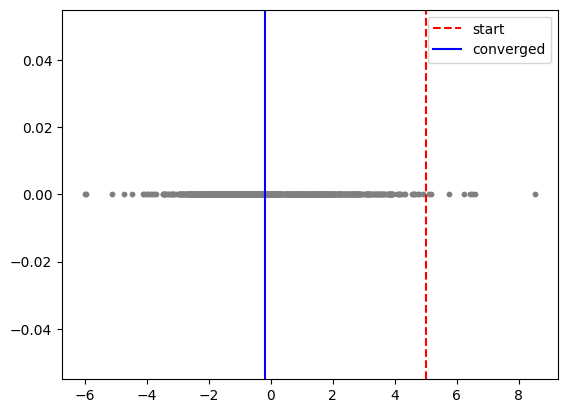

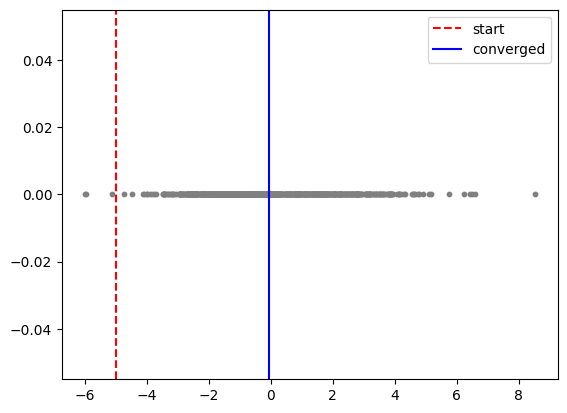

In [135]:
### Insert your solution here ###

# Starting from m = 5
m_start = 5
m_5 = mean_shift(m_start, X, bandwidth = 15, max_iter = 100)

# Plot the results
fig, ax = plt.subplots()
ax.scatter(X, np.zeros_like(X), s = 10, c = 'gray', marker = 'o')
ax.axvline(m_start, color = 'red', linestyle = '--', label = 'start')
ax.axvline(m_5, color = 'blue', linestyle = '-', label = 'converged')
ax.legend()
plt.show()

# Starting from m = -5
m_start = -5
m_n5 = mean_shift(m_start, X, bandwidth=0.1, max_iter=100)

# Plot the results
fig, ax = plt.subplots()
ax.scatter(X, np.zeros_like(X), s=10, c='gray', marker='o')
ax.axvline(m_start, color='red', linestyle='--', label='start')
ax.axvline(m_n5, color='blue', linestyle='-', label='converged')
ax.legend()
plt.show()

## From flat kernel to Epanechnikov

The Epanechnikov kernel is a popular kernel used in the mean shift algorithm. It is defined as:

\begin{align} 
    K(x,z) = 
    \begin{cases} 
        \frac{3}{4} \Big(1 - \frac{\|x - z\|^2}{h^2} \Big) &\text{if } \|x - z\|^2 \leq h^2\;, \\ 
        0 &\text{otherwise} 
    \end{cases} 
\end{align}


The Epanechnikov kernel is a popular choice for the MS algorithm. It has a bounded support, with a flatter shape (compared to a Gaussian kernel), making it less sensitive to outliers.

- Implement the Epanechnikov kernel and repeat the above task with this kernel instead of the flat kernel:

1. Implement meanshift iterations.
2. using samples from the GMM, and starting from $m=5$, what will be mode of the distribution?
3. Now start from $m=-5$. Do you think MS works on our toy data? 

In [136]:
def epanechnikov_kernel(centers, X, bandwidth = 15):
    
    # The inputs and the outputs of your function should be as follows:
    # Inputs - centers : the means (m x 1 numpy array), where m is the number of centres
    #        - X : samples (i x 1 numpy array), where i is the number of samples
    #        - bandwidth : an integer value representing "h" in the equation
    # Output - k : the kernel output for each distance from the means
    
    ### Insert your solution here ###
    K = (X - centers)**2
    K = np.where(K <= bandwidth**2, 1 - K**2, 0)

    return K * 3/4

In [137]:
 ### Insert your solution here ###
max_iter = 100 # Number of iterations for the mean shift algorithm

def mean_shift(centers, X, bandwidth = 1, max_iter = 100):
    for i in range(max_iter):
        K = epanechnikov_kernel(centers, X, bandwidth)
        samples_weighted = K * X
        new_centers = np.sum(samples_weighted, axis=0) / (np.sum(K, axis=0) + 1e-12)
        if np.array_equal(new_centers, centers):
            break
        centers = new_centers
    return centers
    
# Load the samples from the GMM
# Define the GMM parameters
means = np.array([-1, 0, 0.5, 2])
std_devs = np.array([1.0, 2.0, 3.0, 1.0])
weights = np.array([0.6, 0.1, 0.1, 0.2])

# Generate the toy data (samples from the GMM)
num_samples = 1000
chosen_comp = np.random.choice(a=means.shape[0], size=num_samples, p=weights)
X = np.random.normal(loc=means[chosen_comp], scale=std_devs[chosen_comp], size=num_samples).reshape(-1, 1)


Plot the starting points(s), the calculated modes and the PDF. Use different colours for the two cases to better interpret the results.

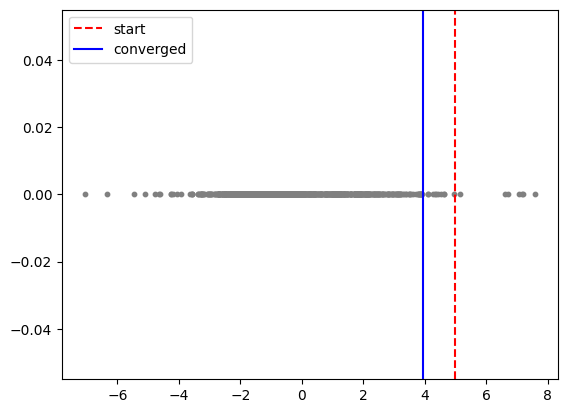

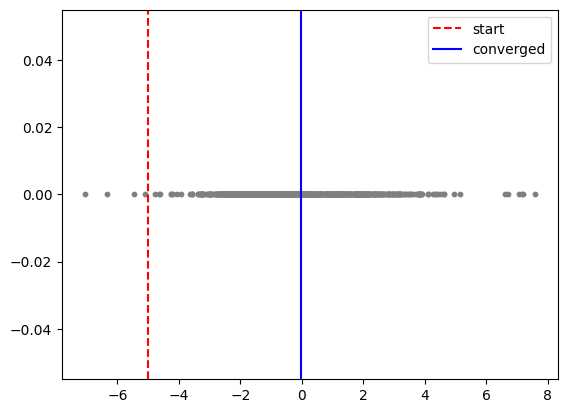

In [138]:
### Insert your solution here ###

# Starting from m = 5
m_start = 5
m_e_5 = mean_shift(m_start, X, bandwidth = 15, max_iter = 100)

# Plot the results
fig, ax = plt.subplots()
ax.scatter(X, np.zeros_like(X), s = 10, c = 'gray', marker = 'o')
ax.axvline(m_start, color = 'red', linestyle = '--', label = 'start')
ax.axvline(m_e_5, color = 'blue', linestyle = '-', label = 'converged')
ax.legend()
plt.show()

# Starting from m = -5
m_start = -5
m_e_n5 = mean_shift(m_start, X, bandwidth=0.1, max_iter=100)

# Plot the results
fig, ax = plt.subplots()
ax.scatter(X, np.zeros_like(X), s=10, c='gray', marker='o')
ax.axvline(m_start, color='red', linestyle='--', label='start')
ax.axvline(m_e_n5, color='blue', linestyle='-', label='converged')
ax.legend()
plt.show()

In [139]:
## Visualise the results for both cases (starting from  m=5  and  m=−5 ) by showing the respective starting point
## and result after convergence plotted on top of the data  X .

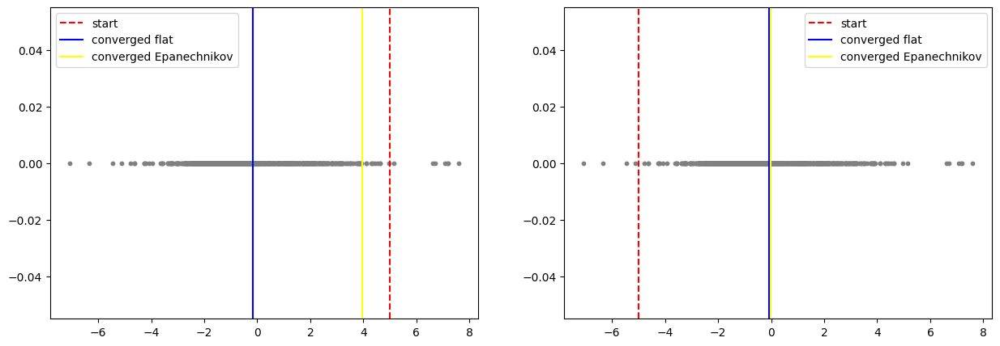

In [155]:
fig = plt.figure(figsize = (15, 5))
plt.subplot(121)
plt.scatter(X, np.zeros_like(X), s = 10, c = 'gray', marker = 'o')
plt.axvline(5, color = 'red', linestyle = '--', label = 'start')
plt.axvline(m_5, color = 'blue', linestyle = '-', label = 'converged flat')
plt.axvline(m_e_5, color = 'yellow', linestyle = '-', label = 'converged Epanechnikov')
plt.legend()

plt.subplot(122)
plt.scatter(X, np.zeros_like(X), s = 10, c = 'gray', marker = 'o')
plt.axvline(-5, color = 'red', linestyle = '--', label = 'start')
plt.axvline(m_n5, color = 'blue', linestyle = '-', label = 'converged flat')
plt.axvline(m_e_n5, color = 'yellow', linestyle = '-', label = 'converged Epanechnikov')
plt.legend()
plt.show()

### Apply Mean-Shift to Segment an Image

Now, we can use the MS algorithm to segment an image. To do this, we will use the implementation of the [sklearn package](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.MeanShift.html) (you will soon see why). Here is what we will do:

1. Given the sharon image, we first apply k-means on pixel colors in two different spaces, RGB and LAB (use opencv for the color conversion). Since we have no idea how many clusters might be in the image, pick a guess (maybe counting the number of 'dominant' colors you can see)

2. Use the MS algorithm and tune its hyperparameters to achieve a reasonable result. 

3. How many colors does MS find in your image? If you fancy, repeat this with an image of your own choice and discuss the result.


In [141]:
from sklearn.cluster import MeanShift
from sklearn import cluster 

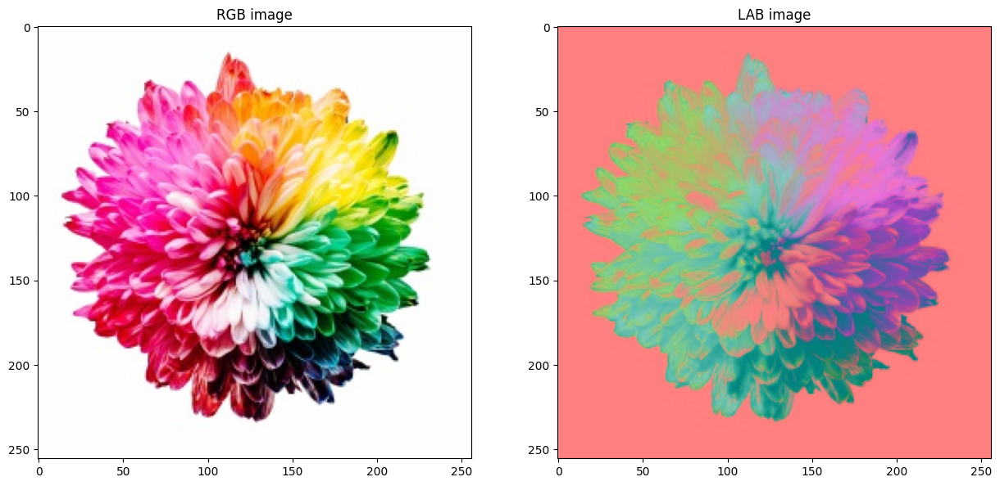

In [142]:
# Load the image and convert it to both RGB and LAB colour space; Visualise your results!
img = cv2.imread('sharon.jpg') # sharon


## Convert to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
## Convert to LAB
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

## Visualise the results
fig = plt.figure(figsize=(15, 8))
plt.subplot(121)
plt.imshow(img_rgb)
plt.title("RGB image")
plt.subplot(122)
plt.imshow(img_lab)
plt.title("LAB image")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


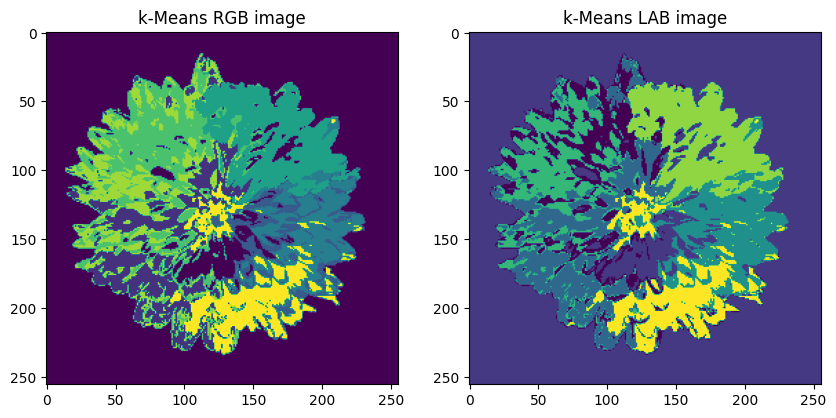

In [143]:
# Run the k-means clustering algorithm from the 'cluster' package of 'sklearn' (imported above) on both images and visualise your results

### Insert your solution here ###
rgb_kmeans = cluster.KMeans(n_clusters = 8)
rgb_kmeans.fit(img_rgb.reshape(-1, 3))
kMeans_rgb = rgb_kmeans.labels_
kMeans_rgb = kMeans_rgb.reshape(256, 256)

lab_kmeans = cluster.KMeans(n_clusters = 7)
lab_kmeans.fit(img_lab.reshape(-1, 3))
kMeans_lab = lab_kmeans.labels_
kMeans_lab = kMeans_lab.reshape(256, 256)

## Visualize the k-Means clustered results
plt.figure(figsize = (10, 5))

plt.subplot(121)
plt.imshow(kMeans_rgb)
plt.title("k-Means RGB image")

plt.subplot(122)
plt.imshow(kMeans_lab)
plt.title("k-Means LAB image")

plt.show()


### Now, let's do Mean-Shift Clustering

Note that to speed up the process, we suggest you randomly select around 500 datapoints from the image and fit the model using this subset of datapoints. </br> You can then 'predict' the corresponding cluster centers (labels) for all other datapoints using this fitted MeanShift model. Remember you can look at the sklearn documentation for more information about the MeanShift() module </br>

In [144]:
# MeanShift Clustering for RGB and LAB image

# We are setting a fixed seed here
np.random.seed(17)

num_rand_samples = 500; # Number of random samlpes -- Feel free to tune this if needed

h, w, _ = img.shape
rnd_idx = np.random.choice(h*w,num_rand_samples)  # <-- Can be used to 'select' the datapoints from the (flattened) image via indexing

### Insert your solution here ###
## RGB color space
image_rgb_subset = img_rgb.reshape(-1, 3)[rnd_idx]
ms_rgb = MeanShift().fit(image_rgb_subset)
cluster_idx_rgb = ms_rgb.predict(img_rgb.reshape(-1, 3))
centroids_rgb = ms_rgb.cluster_centers_
n_colors_rgb = len(np.unique(cluster_idx_rgb))

print("Number of colors in RGB space: ", n_colors_rgb)

## LAB color space
image_lab_subset = img_lab.reshape(-1, 3)[rnd_idx]
ms_lab = MeanShift().fit(image_lab_subset)
cluster_idx_lab = ms_lab.predict(img_lab.reshape(-1, 3))
centroids_lab = ms_lab.cluster_centers_
n_colors_lab = len(np.unique(cluster_idx_lab))

print("Number of colors in LAB space: ", n_colors_lab)


Number of colors in RGB space:  8
Number of colors in LAB space:  7


### Visualise them all!

Visualise all four resulting clustered images: k-Means RGB & LAB, as well as mean shift RGB & LAB. </br> _Hint_: Make sure to display all results in the RGB space (and convert appropriately).

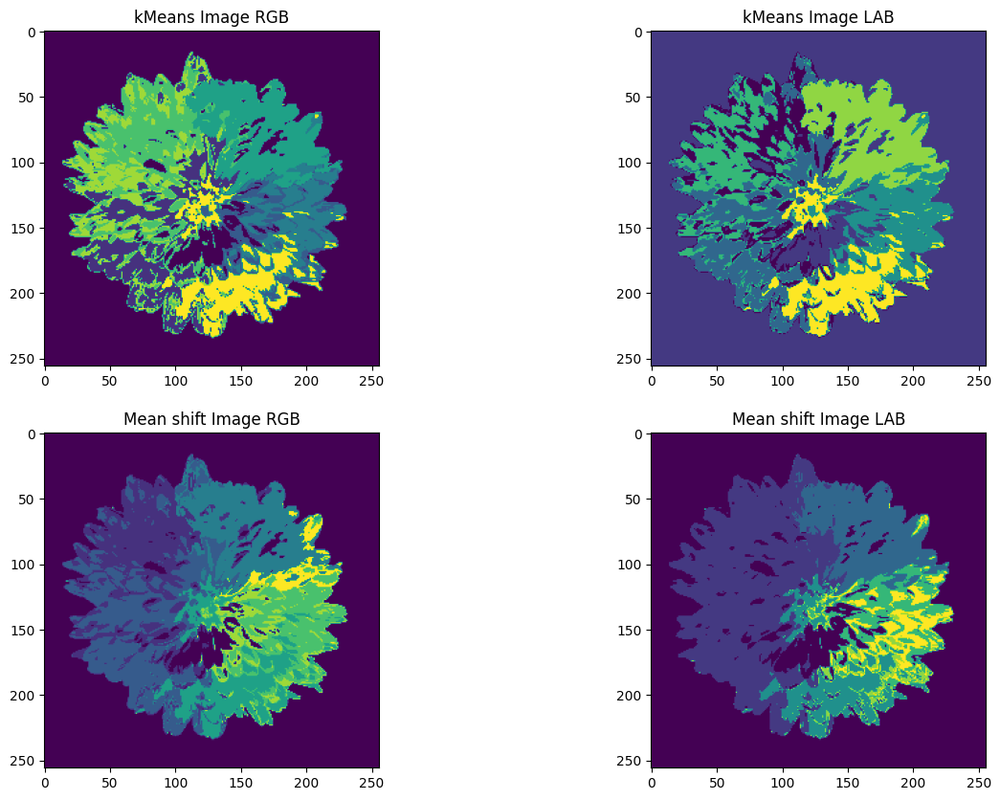

In [145]:
# Plot the original image and the segmented images
plt.figure(figsize=(15, 10))

plt.subplot(221)
plt.imshow(kMeans_rgb.reshape(256, 256))
plt.title("kMeans Image RGB")

plt.subplot(222)
plt.imshow(kMeans_lab.reshape(256, 256))
plt.title("kMeans Image LAB")

plt.subplot(223)
plt.imshow(cluster_idx_rgb.reshape(256, 256))
plt.title("Mean shift Image RGB")

plt.subplot(224)
plt.imshow(cluster_idx_lab.reshape(256, 256))
plt.title("Mean shift Image LAB")

plt.show()


<div class="alert alert-block alert-success">
    
    
    
#### What do you notice about the mean-shift algorithm compared to the k-means for the RGB and LAB images?
    
Write your answer here

</div>

In [146]:
##
## Answer:
## 1. The k-means needs to initialise the cluster number,
## but the mean shift automatically determines the number of clusters based on the data's density. 
## 2. The mean shift method takes more time to compute the results, which means it is cost expensive.
## 3. The K means using different initialised centroids can lead to different final clusterings. 
## 4. The RGB image based on the additive color model and the LAB color space based on the perceptual color model, 
## so mean shift is better on the LAB color space because it uses data density.
## 5. The LAB color space is also better than RGB when using kMeans method,
## because it provides better color separation, is perceptually uniform.
## This makes it easier to group similar colors together and produce accurate results.

<div class="alert alert-block alert-info">
    
## Tasks 6: Comparison between k-Means, k-Means++ Initialization and Mean-Shift algorithm.
    
In this task, you will visualize the effects of random initialization, k-Means++ initialization and the Mean Shift algorithm by plotting the final clustering result of all data points together with their **final** cluster centers (using 3D scatter plots, similar to Task 2). </br> For the two k-means methods, additionally plot their **initial** centroids!
    
    
</div>

In [147]:
# We are setting a fixed seed here
np.random.seed(17)

In [148]:
# Load the image and convert it to both RGB
img_sharon = cv2.imread('sharon.jpg')
img_sharon = cv2.cvtColor(img_sharon, cv2.COLOR_BGR2RGB)

#### Use random initialization to cluster the pixels of the *sharon.jpg* image.

In [149]:
### Insert your solution here ###

# Randomly initialize the centroids and obtain the clustering results -- you can choose T=20 iterations to start with

### Insert your solution here ###
## Initialize centroids, perform k-means for 20 iterations and visualise the clustered colour image
centroids = random_centroids(img_sharon, 6)
cluster_idx, centroids, kMeans_loss = mykMeans(img_sharon.reshape(-1, 3), centroids, 20)


#### Use k-Means++ initialization to cluster the pixels of the *sharon.jpg* image. 

In [150]:
### Insert your solution here ###

# Initialize the centroids via k-Means++ and obtain the clustering results -- you can choose T=20 iterations to start with

## Initialise the centroids with the kmeans++ method, and run the clustering
## Generate the initial centroids using K-means++ initialization
centroids_1 = kmeanspp_centroids(img_sharon.reshape(-1, 3), 4)
cluster_idx_1, centroids_1, kMeans_loss_1 = mykMeans(img_sharon.reshape(-1, 3), centroids_1, 20)


#### Use Mean Shift to cluster the pixels of the *sharon.jpg* image. 

In [151]:
### Insert your solution here ###

## random select 500 points
num_rand_samples = 500; # Number of random samlpes -- Feel free to tune this if needed
h, w, _ = img.shape
rnd_idx = np.random.choice(h*w,num_rand_samples)  # <-- Can be used to 'select' the datapoints from the (flattened) image via indexing

## Apply the mean-shift algorithm to cluster the pixels of the sharon.jpg image
ms = MeanShift().fit(img_sharon.reshape(-1, 3)[rnd_idx])
cluster_idx_2 = ms.predict(img_sharon.reshape(-1, 3))
centroids_2 = ms.cluster_centers_

Plot the generated centroids from each initialization method together with the final clustering result of the data points (by using corresponding centroid colours). You may want generate a side-by-side plot for easier comparison of the three methods (e.g. via subplots). Also make sure to clearly label your methods as well as axes in the plot.

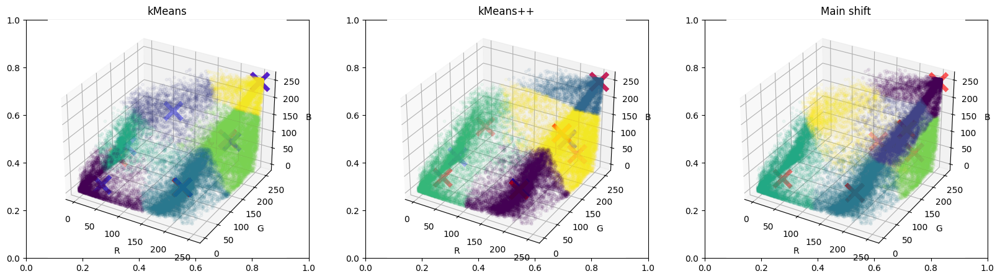

In [152]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

## kMeans 
# centroids = random_centroids(img_sharon, 6)
# cluster_idx, centroids, kMeans_loss = mykMeans(img_sharon.reshape(-1, 3), centroids, 20)
ax1 = fig.add_subplot(131, projection = '3d')
ax1.scatter(img_sharon.reshape(-1, 3)[:, 0], img_sharon.reshape(-1, 3)[:, 1], img_sharon.reshape(-1, 3)[:, 2], c = cluster_idx, s = 10, alpha = 0.06)
ax1.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c = 'b', marker = 'x', s = 400, linewidth = 5)
ax1.scatter(centroids_kmeans[:, 0], centroids_kmeans[:, 1], centroids_kmeans[:, 2], c = 'r', marker = 'x', s = 400, linewidth = 5)
ax1.set_title("kMeans")
ax1.set_xlabel('R')
ax1.set_ylabel('G')
ax1.set_zlabel('B')

## kMeans++
# centroids_1 = kmeanspp_centroids(img_sharon.reshape(-1, 3), 4)
# cluster_idx_1, centroids_1, kMeans_loss_1 = mykMeans(img_sharon.reshape(-1, 3), centroids_1, 20)
ax2 = fig.add_subplot(132, projection = '3d')
ax2.scatter(img_sharon.reshape(-1, 3)[:, 0], img_sharon.reshape(-1, 3)[:, 1], img_sharon.reshape(-1, 3)[:, 2], c = cluster_idx_1, s = 10, alpha = 0.06)
ax2.scatter(centroids_1[:, 0], centroids_1[:, 1], centroids_1[:, 2], c = 'b', marker = 'x', s = 400, linewidth = 5)
ax2.scatter(centroids_kmeanspp[:, 0], centroids_kmeanspp[:, 1], centroids_kmeanspp[:, 2], c = 'r', marker = 'x', s = 400, linewidth = 5)
ax2.set_title("kMeans++")
ax2.set_xlabel('R')
ax2.set_ylabel('G')
ax2.set_zlabel('B')

## Main shift
# num_rand_samples = 500
# h, w, _ = img.shape
# rnd_idx = np.random.choice(h*w,num_rand_samples) 
# ms = MeanShift().fit(img_sharon.reshape(-1, 3)[rnd_idx])
# cluster_idx_2 = ms.predict(img_sharon.reshape(-1, 3))
# centroids_2 = ms.cluster_centers_
ax3 = fig.add_subplot(133, projection = '3d')
ax3.scatter(img_sharon.reshape(-1, 3)[:, 0], img_sharon.reshape(-1, 3)[:, 1], img_sharon.reshape(-1, 3)[:, 2], c = cluster_idx_2, s = 10, alpha = 0.06)
ax3.scatter(centroids_2[:, 0], centroids_2[:, 1], centroids_2[:, 2], c = 'r', marker = 'x', s = 400, linewidth = 5)
ax3.set_title("Main shift")
ax3.set_xlabel('R')
ax3.set_ylabel('G')
ax3.set_zlabel('B')

plt.show()

<div class="alert alert-block alert-success">
    
    
    
#### What do you notice about the mean-shift clustering compared to the k-means algorithms? And how do the two k-means initializations differ?
    
Write your answer here

</div>

In [153]:
##
## Answer:
## K-means needs to initialise initial cenroids, then keep updating until converge.
## However, mean shift has no assumption about centroids number or position,
## it use density of the data to get centroids .
## So we can see they have different centroids in converge figure.

## In Random Initialization method, the initial centroids are chosen randomly from the data points.
## This method is simple to use, but the result is sensitive to the initial centroid selection.
## In kMeans++ method the initial centroids selected are well spaced apart, so it can reduce the chances 
## of ending up with suboptimal.
## kMeans and kMeans++ are centroid-based algorithm. In this case they have the close centroids with the same initialised centroids number.

Also observe the location of the initial centroids of random initialization and the K-means++ method!

In [154]:
##
## Answer:
## The location of the initial centroids of random initialization didn't change much.
## However, the location of the initial centroids of kMeans++ changed a lot.